# Source Detections (photutils), Making IMFIT regions

In [61]:
import sys
import glob
sys.path.append("/Users/arames52/Research/Analysis/")
import open_fits
import numpy as np
from matplotlib import colors
import matplotlib.pyplot as plt
from scipy.spatial import distance
from photutils.segmentation import detect_sources
from photutils.segmentation import SourceCatalog
from astropy import units as u
from astropy.coordinates import Angle
import pandas as pd
from astropy.wcs.utils import proj_plane_pixel_scales as ps
import warnings
warnings.filterwarnings("ignore")
from photutils.aperture import CircularAnnulus, CircularAperture,EllipticalAperture

In [62]:
weak_detections =  ["CDFS19", "ES1-35", "ES1_z_0.88"]
good_detections = ["CDFS-18", "ES1-18", "ES1-25", "ES1_z_0.99","ES1_z_0.99b","ES1_z_1.04","ES1_z_1.38","ES1_z_1.40",
"ES1_z_1.60", "ES1_z_1.65", "ES1_z_1.70", "XMM-113", "XMM-11", "XMM-29", "XMM-30", "XMM_z_0.81", "XMM_z_0.9", "XMM_z_1.0"]
detections = weak_detections + good_detections

img_path = img_path = "/Users/arames52/Research/Data/CASA_Outputs/Natural/fits/"

img_type_path = {'briggs' : 'Briggs/fits/', 'natural' : 'Natural/fits/', 'taper_1' :'UVtaper/0.7"/fits/','taper_2' : 'UVtaper/1"/fits/',
'taper_3' : 'UVtaper/2"/fits/','taper_4' : 'UVtaper/3"/fits/'}

In [63]:
def source_extractor(image, source_center_coord, threshold):

    segment_map = detect_sources(image, threshold, npixels=12)
    source_catalog = SourceCatalog(image, segment_map)
    apertures = source_catalog.kron_aperture

    seperations = []
    for coords in apertures:
        dist = distance.cdist([coords.positions], [source_center_coord])[0][0]
        seperations.append(dist)

    source_index = seperations.index(np.min(seperations))
    source_aperture = apertures[source_index]

    return source_aperture, segment_map

In [64]:
# discard_3sig_taper = ["ES1-18", "XMM-11", "XMM-29", "XMM_z_0.81", "XMM_z_0.9", "XMM_z_1.0"]
# lower_threshold_briggs = ["ES1_z_0.99","ES1_z_0.99b", "XMM-113", "XMM_z_0.81", "XMM_z_0.9"]
# lower_threshold_natural = ["ES1_z_0.99b"]

In [65]:
save_path = "/Users/arames52/Research/Analysis/Plots/CASA_regions/"
import pickle
with open("/Users/arames52/Research/Analysis/mrs.pkl", "rb") as f:
    mrs_dict = pickle.load(f)

IndexError: list index out of range

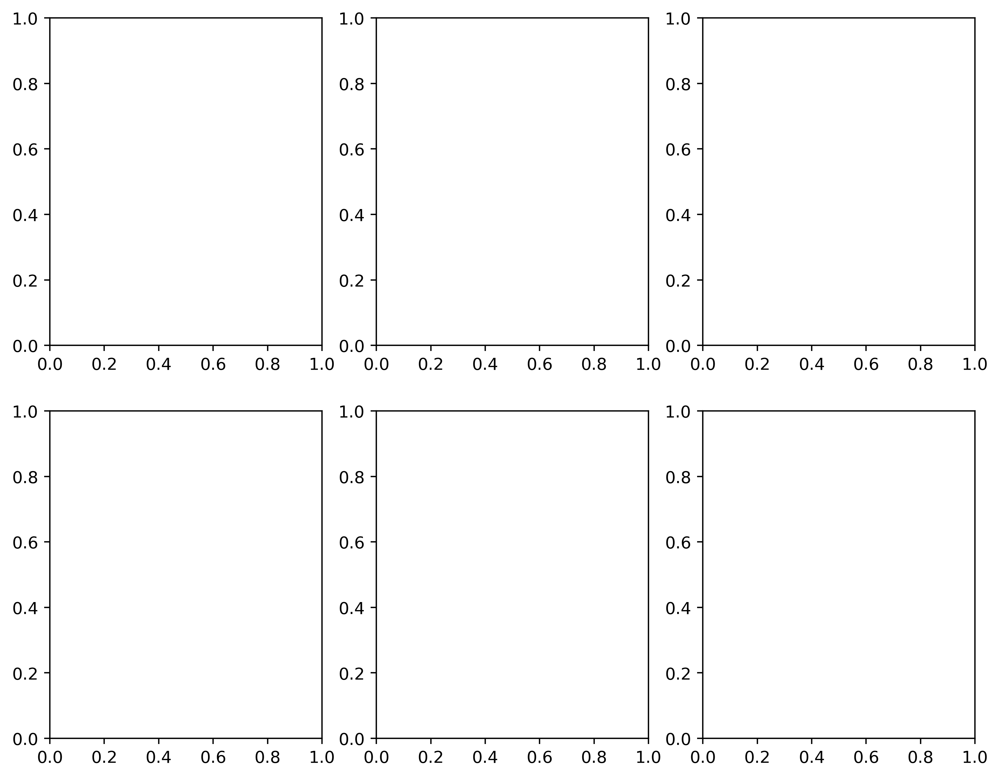

In [66]:
%matplotlib inline
figure_title = ["Briggs, r = 0.5", "Natural", 'UVtaper 0.7"', 'UVtaper 1"', 'UVtaper 2"', 'UVtaper 3"']
for bcg in good_detections:
    fig,ax = plt.subplots(2,3, figsize = (10,8), dpi = 400)
    ax = ax.ravel()
    for img_type, i in zip(list(img_type_path.keys()), range(0,6)):
        if bcg in lower_threshold_briggs and img_type == "briggs":
            threshold = 2.5 * 2e-5
        elif bcg in lower_threshold_natural and img_type == "natural":
            threshold = 3 * 2e-5
        else:
            threshold = 4 * 2e-5
        file = glob.glob(img_path + img_type_path[img_type] + bcg + "_*.fits")[0]
        data, header, wcs = open_fits.read_alma_fits(file)
        cutout = open_fits.image_cutout(file, 20)
        cutout_image = cutout.data
        pixel_scale = ps(wcs)[0]
        cutout_image[cutout_image<0] = 0
        central_aperture, segment_map = source_extractor(cutout_image, cutout.center_cutout, threshold)
        
        if img_type in ["taper_3", "taper_4"]:
            rin = 10
            rout = 14
        else:
            rin = 5
            rout = 8
        if bcg in discard_3sig_taper and img_type == "taper_4":
            ax[i].axis('off')
            continue
        else:
            ax[i].matshow(cutout_image, norm = colors.SymLogNorm(linthresh = 0.0001), origin = 'lower',cmap = "CMRmap")
            ax[i].set_title(figure_title[i])
            ax[i].xaxis.set_visible(False)
            ax[i].yaxis.set_visible(False)
            mrs_region = CircularAperture(positions = central_aperture.positions, r = 2/(0.045))
            rms_annulus = CircularAnnulus(positions = central_aperture.positions, r_in = rin/0.045, r_out = rout/0.045)
            mrs_region.plot(axes = ax[i], color = 'bisque', ls = 'dotted', lw = 2, label = "MRS")
            rms_annulus.plot(axes = ax[i], color = 'cyan', ls = "--", lw = 1.5, label = "RMS Annulus")
#             central_aperture.plot(axes = ax[i],color='white', lw=1.5, label = "IMFIT region")
    ax[1].legend()
    fig.suptitle(bcg)
#     fig.savefig(save_path + bcg + "_imfit_regions.jpg", dpi = 400)

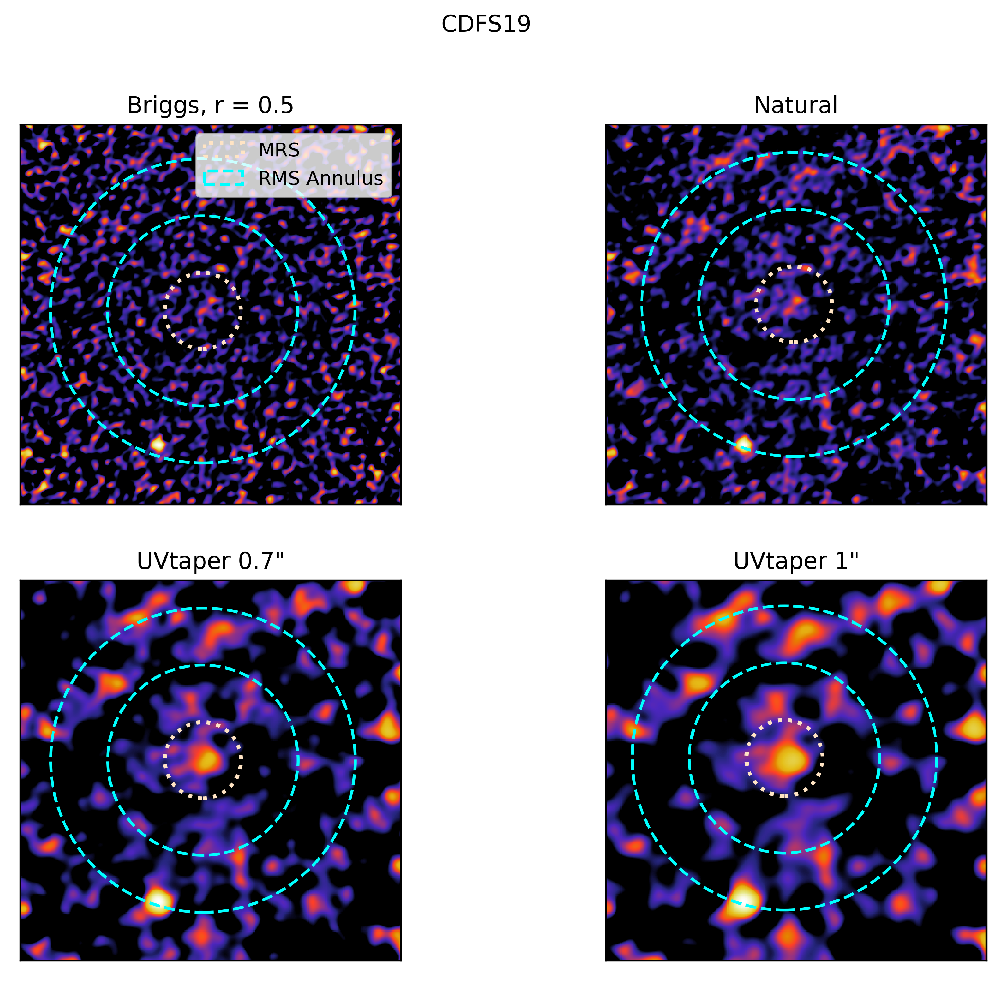

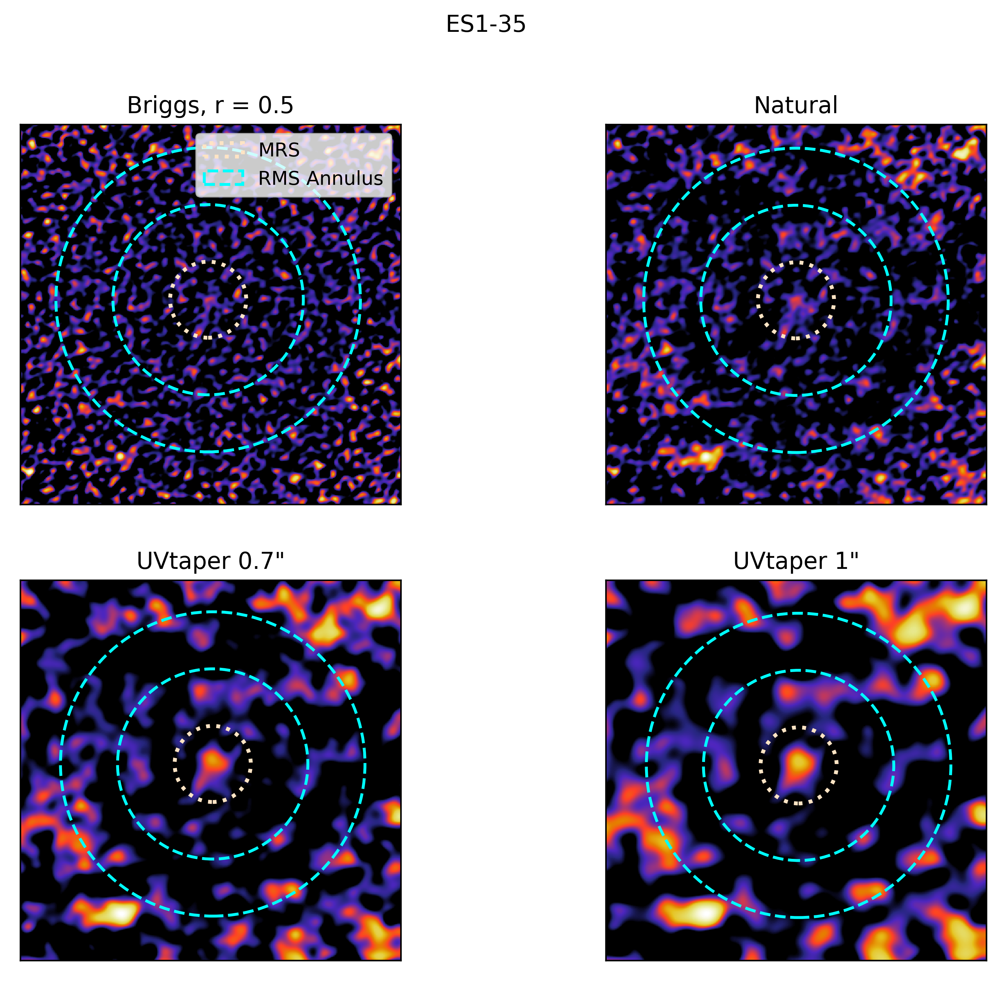

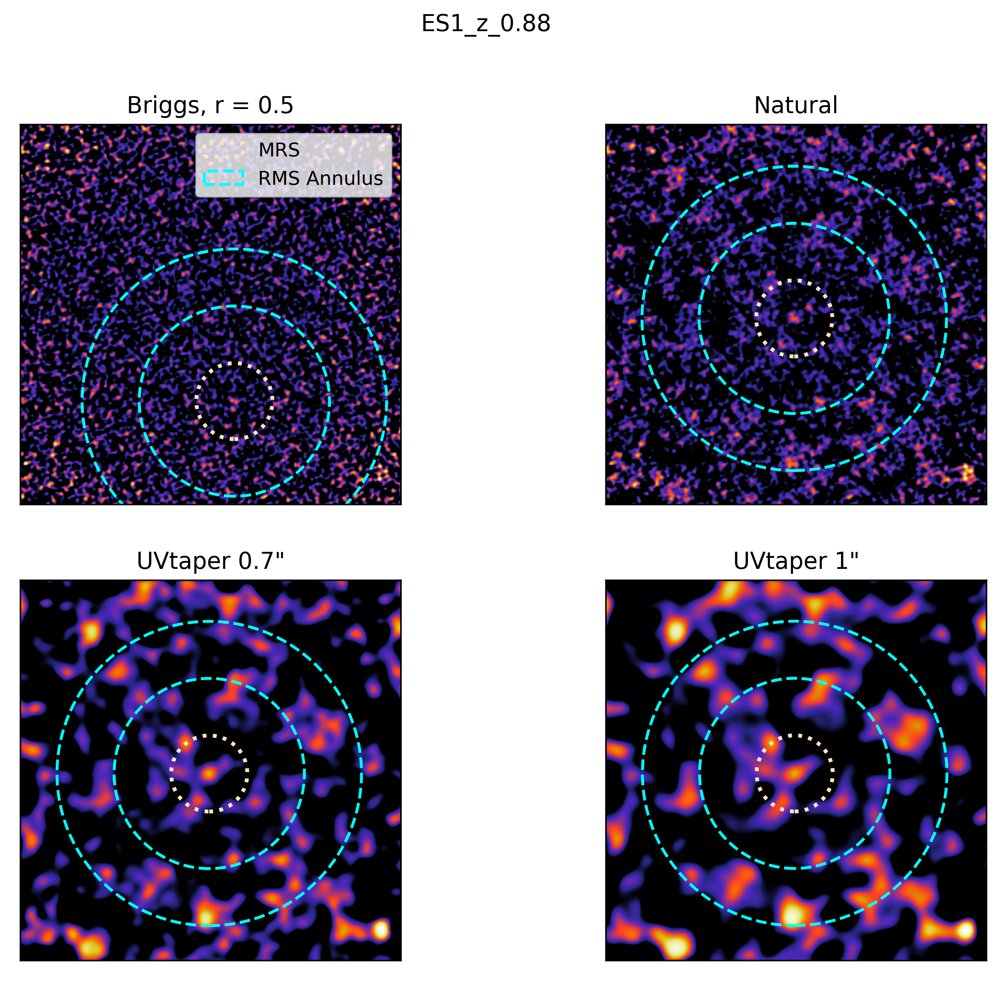

In [40]:
%matplotlib inline
for bcg in weak_detections:
    fig,ax = plt.subplots(2,2, figsize = (10,8), dpi = 400)
    ax = ax.ravel()
    for img_type, i in zip(list(img_type_path.keys()), range(0,4)):
        threshold = 2.5*2e-5
        file = glob.glob(img_path + img_type_path[img_type] + bcg + "_*.fits")[0]
        data, header, wcs = open_fits.read_alma_fits(file)
        cutout = open_fits.image_cutout(file, 20)
        cutout_image = cutout.data
        pixel_scale = ps(wcs)[0]
        cutout_image[cutout_image<0] = 0
        central_aperture, segment_map = source_extractor(cutout_image, cutout.center_cutout, threshold)
        
        rin = 5
        rout = 8
        ax[i].matshow(cutout_image, norm = colors.SymLogNorm(linthresh = 0.0001), origin = 'lower',cmap = "CMRmap")
        ax[i].set_title(figure_title[i])
        ax[i].xaxis.set_visible(False)
        ax[i].yaxis.set_visible(False)
        mrs_region = CircularAperture(positions = central_aperture.positions, r = 2/0.045)
        mrs_region.plot(axes = ax[i], color = 'bisque', ls = 'dotted', lw = 2, label = "MRS")
        rms_annulus = CircularAnnulus(positions = central_aperture.positions, r_in = rin/0.045, r_out = rout/0.045)
        rms_annulus.plot(axes = ax[i], color = 'cyan', ls = "--", lw = 1.5, label = "RMS Annulus")
#         central_aperture.plot(axes = ax[i],color='white', lw=1.5, label = "IMFIT region")
    ax[0].legend()
    fig.suptitle(bcg)
#     fig.savefig(save_path + bcg + "_imfit_regions.jpg", dpi = 400)

In [511]:
# label = np.argmax(segment_map.areas) + 1
# segmap = segment_map.data == label
# implt.imshow(segmap, origin='lower', cmap='gray')

# Plotting basic image stats

In [53]:
with open("/Users/arames52/Research/Analysis/IMFIT/Codes/imfit_residual_final_.pkl", "rb") as f:
    imfit_results = pickle.load(f)
# with open("/Users/arames52/Research/Analysis/IMFIT/Codes/noise_rms.pkl", "rb") as f:
#     rms_results = pickle.load(f)
# with open("//Users/arames52/Research/Analysis/IMFIT/Codes/signal_to_noise.pkl", "rb") as f:
#     sn_results = pickle.load(f)

In [18]:
bcgs = list(imfit_results.keys())

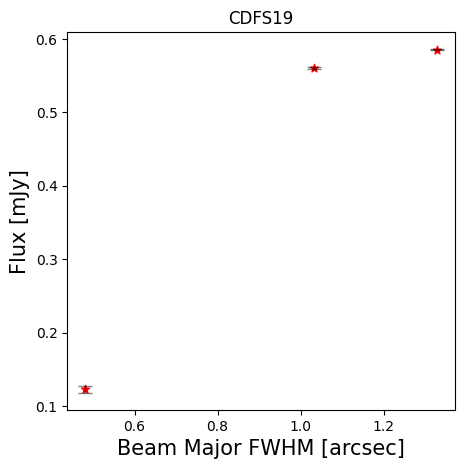

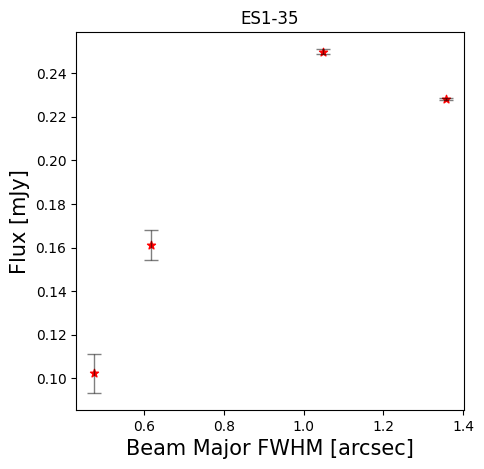

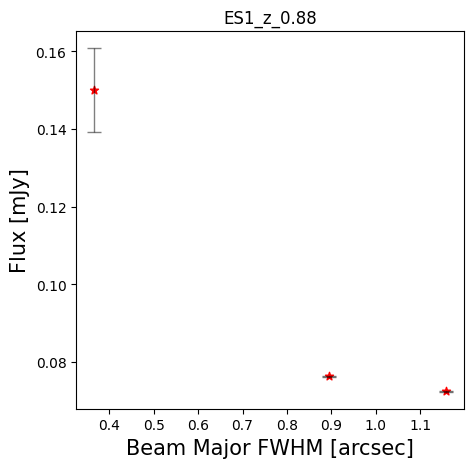

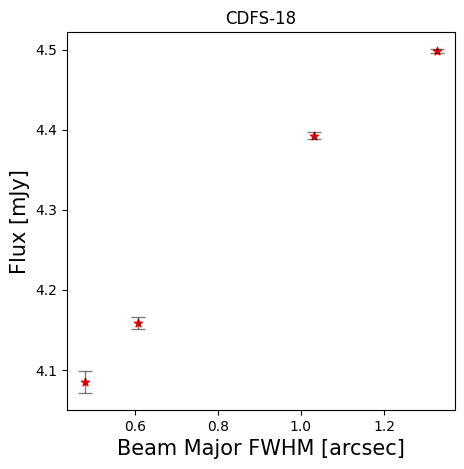

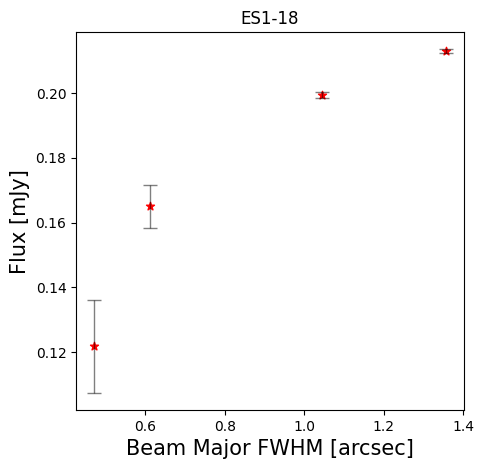

...

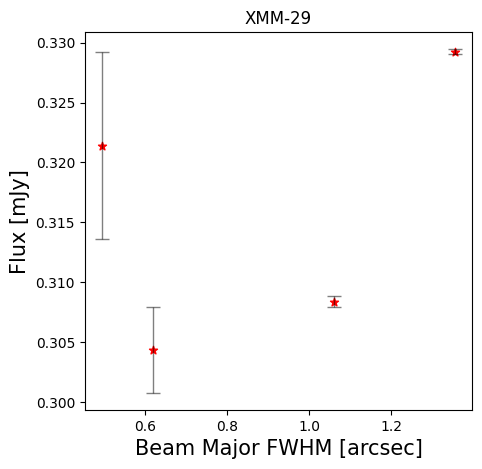

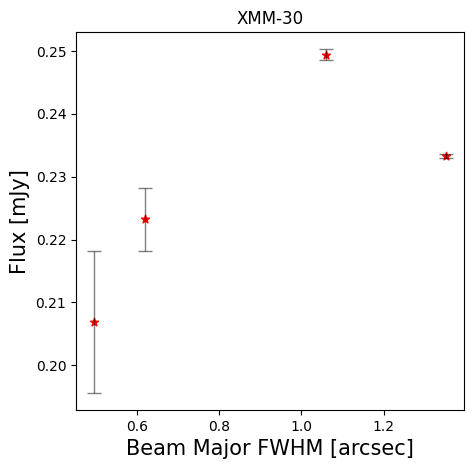

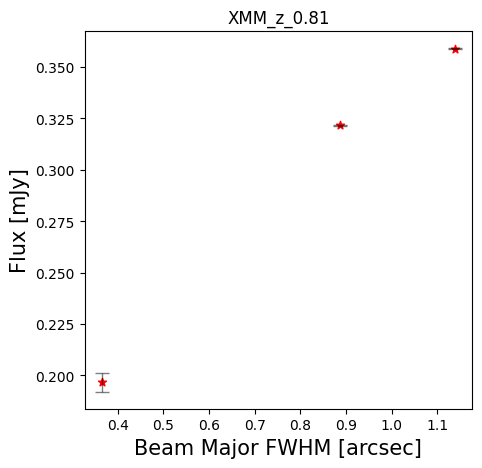

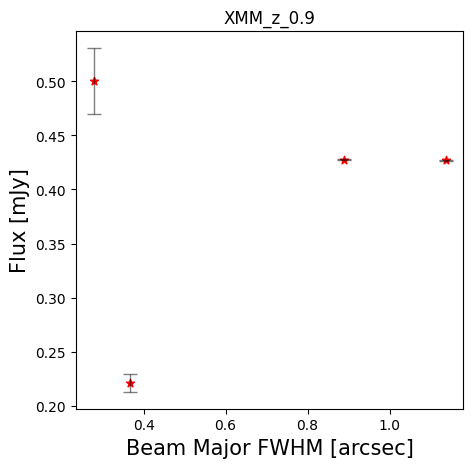

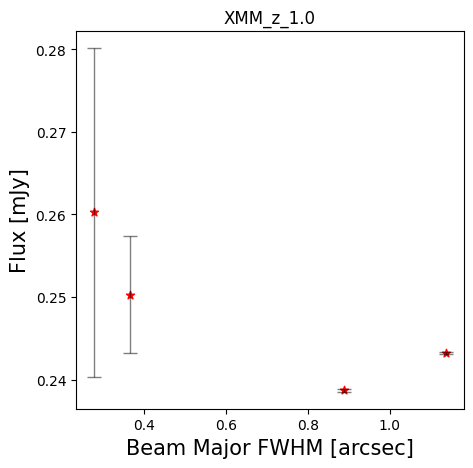

In [20]:
for i in range(len(bcgs)):
    fig,ax = plt.subplots(1,1, figsize = (5,5), dpi = 100)
    imfit_bcg = imfit_results[bcgs[i]]
    rms_bcg = rms_results[bcgs[i]]
    sn_bcg = sn_results[bcgs[i]]
#     print(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type])
    for img_type in ['briggs', 'natural', 'taper_1', 'taper_2']:
        if imfit_bcg[img_type]['converged'][0] == True:
#         ax[0].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type], marker = '*', color = 'red')
#         ax[1].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], sn_bcg[img_type], marker = '*', color = 'red')
            ax.scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, marker = '*', color = 'red')
            ax.errorbar(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, yerr = imfit_bcg[img_type]['results']['component0']['flux']['error'][0]*1000, ls = 'none', ecolor = 'black', alpha = 0.5,solid_capstyle='projecting', capsize=5, elinewidth = 1)
            ax.set_title(bcgs[i])
            ax.set_xlabel("Beam Major FWHM [arcsec]", size = 15)
            ax.set_ylabel("Flux [mJy]", size = 15)
#     fig.savefig(save_path + bcgs[i] + "_imfit_flux.jpg")

Text(0.1, 0.5, 'Flux [mJy]')

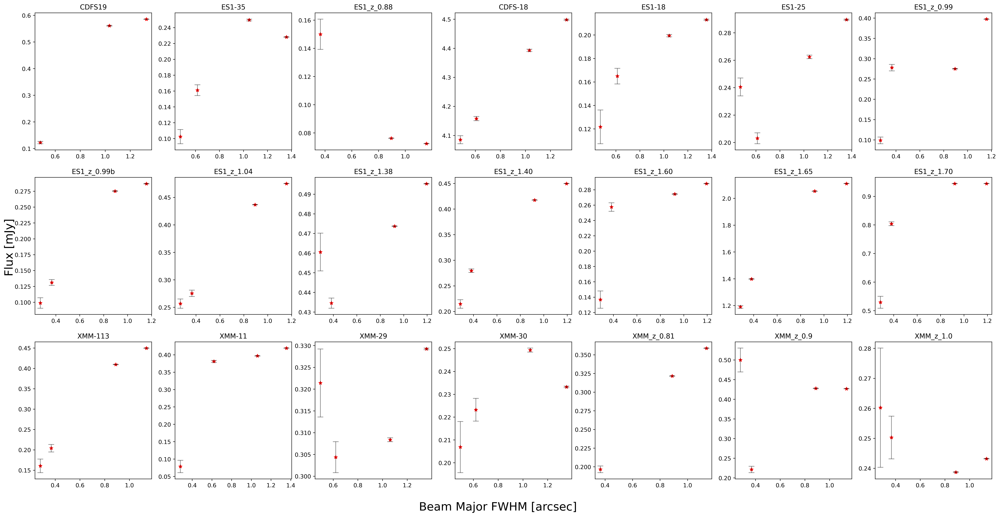

In [21]:
fig,ax = plt.subplots(3,7, figsize = (30,15), dpi = 400)
ax = ax.ravel()
for i in range(len(bcgs)):
    imfit_bcg = imfit_results[bcgs[i]]
    rms_bcg = rms_results[bcgs[i]]
    sn_bcg = sn_results[bcgs[i]]
#     print(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type])
    for img_type in ['briggs', 'natural', 'taper_1', 'taper_2']:
        if imfit_bcg[img_type]['converged'][0] == True:
#         ax[0].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type], marker = '*', color = 'red')
#         ax[1].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], sn_bcg[img_type], marker = '*', color = 'red')
            ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, marker = '*', color = 'red')
            ax[i].errorbar(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, yerr = imfit_bcg[img_type]['results']['component0']['flux']['error'][0]*1000, ls = 'none', ecolor = 'black', alpha = 0.5,solid_capstyle='projecting', capsize=5, elinewidth = 1)
            ax[i].set_title(bcgs[i])
fig.supxlabel("Beam Major FWHM [arcsec]", y = 0.07, size = 20)
fig.supylabel("Flux [mJy]", x = 0.1, size = 20)

Text(0.1, 0.5, 'RMS')

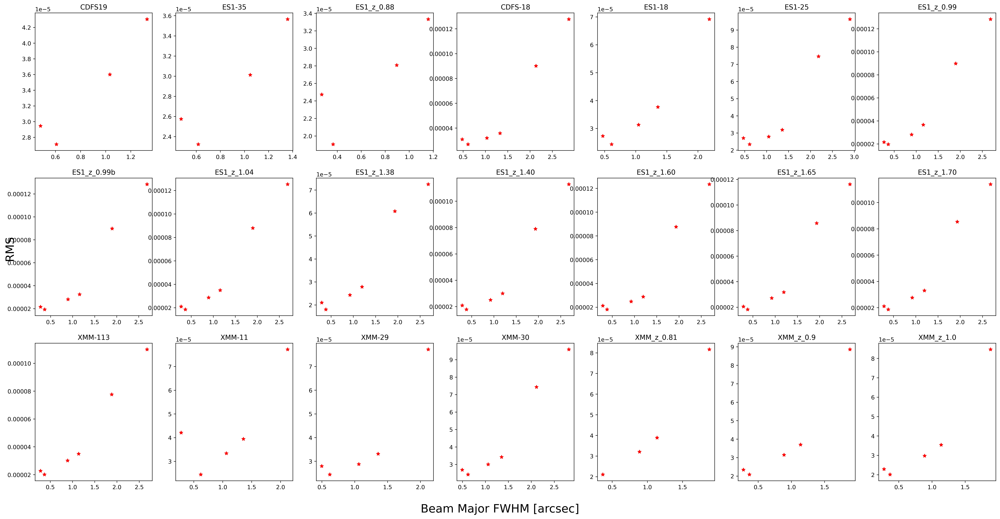

In [589]:
fig,ax = plt.subplots(3,7, figsize = (30,15), dpi = 400)
ax = ax.ravel()
for i in range(len(bcgs)):
    imfit_bcg = imfit_results[bcgs[i]]
    rms_bcg = rms_results[bcgs[i]]
    sn_bcg = sn_results[bcgs[i]]
#     print(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type])
    for img_type in list(imfit_bcg.keys()):
        if imfit_bcg[img_type]['converged'][0] == True:
            ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type], marker = '*', color = 'red')
#         ax[1].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], sn_bcg[img_type], marker = '*', color = 'red')
#             ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, marker = '*', color = 'red')
#             ax[i].errorbar(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, yerr = imfit_bcg[img_type]['results']['component0']['flux']['error'][0]*1000, ls = 'none', ecolor = 'black', alpha = 0.5,solid_capstyle='projecting', capsize=5, elinewidth = 1)
            ax[i].set_title(bcgs[i])
fig.supxlabel("Beam Major FWHM [arcsec]", y = 0.07, size = 20)
fig.supylabel("RMS", x = 0.1, size = 20)

Text(0.1, 0.5, 'S/N')

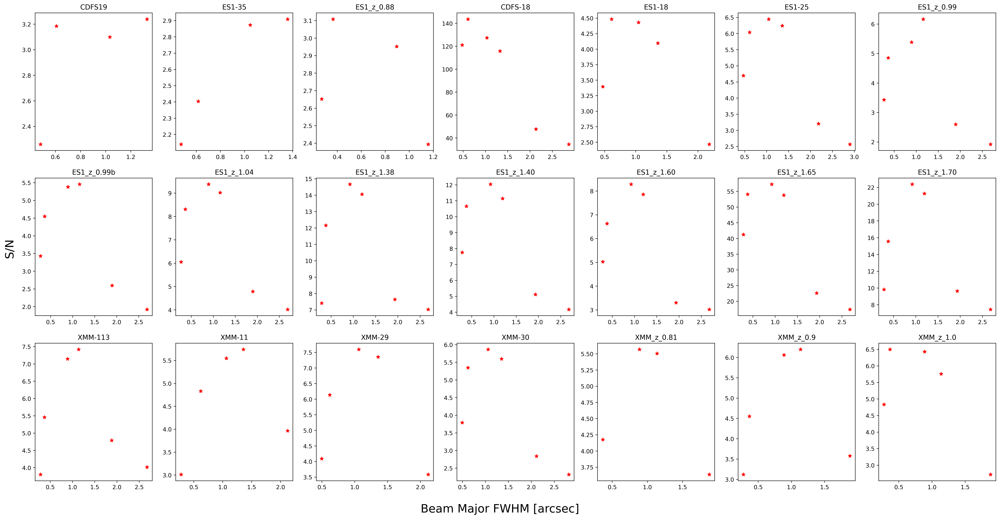

In [590]:
fig,ax = plt.subplots(3,7, figsize = (30,15), dpi = 400)
ax = ax.ravel()
for i in range(len(bcgs)):
    imfit_bcg = imfit_results[bcgs[i]]
    rms_bcg = rms_results[bcgs[i]]
    sn_bcg = sn_results[bcgs[i]]
#     print(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type])
    for img_type in list(imfit_bcg.keys()):
        if imfit_bcg[img_type]['converged'][0] == True:
#             ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], rms_bcg[img_type], marker = '*', color = 'red')
            ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], sn_bcg[img_type], marker = '*', color = 'red')
#             ax[i].scatter(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, marker = '*', color = 'red')
#             ax[i].errorbar(imfit_bcg[img_type]['results']['component0']['beam']['beamarcsec']['major']['value'], imfit_bcg[img_type]['results']['component0']['flux']['value'][0]*1000, yerr = imfit_bcg[img_type]['results']['component0']['flux']['error'][0]*1000, ls = 'none', ecolor = 'black', alpha = 0.5,solid_capstyle='projecting', capsize=5, elinewidth = 1)
            ax[i].set_title(bcgs[i])
fig.supxlabel("Beam Major FWHM [arcsec]", y = 0.07, size = 20)
fig.supylabel("S/N", x = 0.1, size = 20)

 # Gaussian Profile plot

In [67]:
residual_file_path = "/Users/arames52/Research/Analysis/IMFIT/Residuals/"
image_file_path = "/Users/arames52/Research/Data/CASA_Outputs/Natural/fits/"
weak_detections =  ["CDFS19", "ES1-35", "ES1_z_0.88"]
good_detections = ["CDFS-18", "ES1-18", "ES1-25", "ES1_z_0.99","ES1_z_0.99b","ES1_z_1.04","ES1_z_1.38","ES1_z_1.40",
"ES1_z_1.60", "ES1_z_1.65", "ES1_z_1.70", "XMM-113", "XMM-11", "XMM-29", "XMM-30", "XMM_z_0.81", "XMM_z_0.9", "XMM_z_1.0"]
detections = weak_detections + good_detections
imfit_results_natural = {}
for k in imfit_results.keys():
    imfit_results_natural[k] = imfit_results[k]

In [68]:
from palettable.cartocolors.sequential import *
from palettable.cartocolors.qualitative import *
from palettable.cartocolors.diverging import *
from palettable.cmocean.sequential import *

In [75]:
gaussian_effective_radius = {}

In [89]:
import matplotlib.backends.backend_pdf

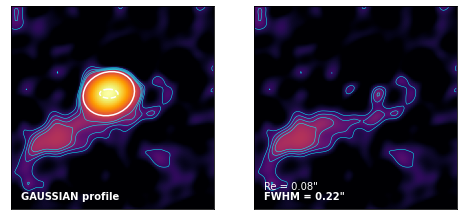

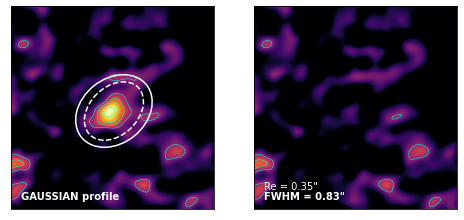

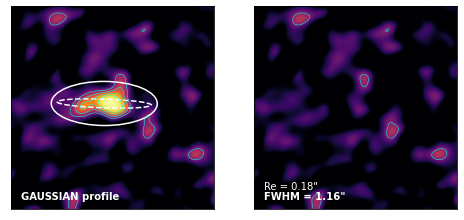

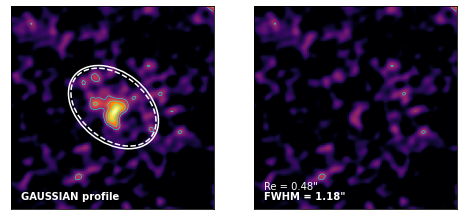

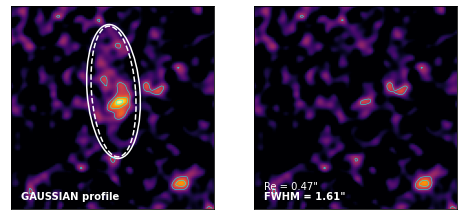

...

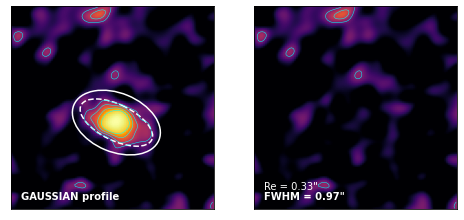

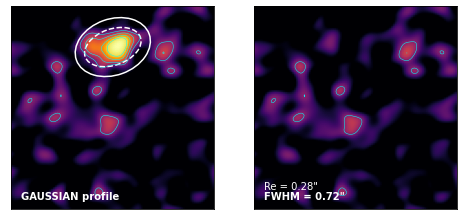

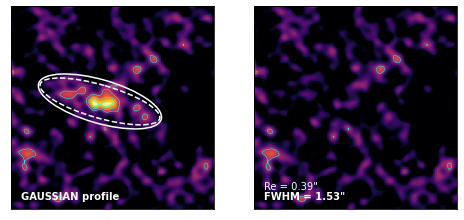

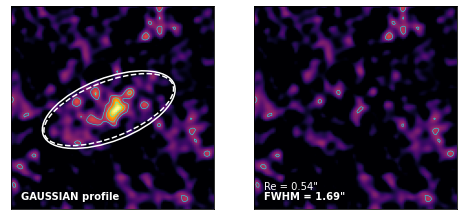

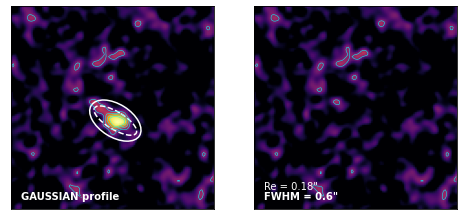

In [94]:
for bcg in good_detections:
    image_file = image_file_path + bcg + "_natural.fits"
    residual_file = residual_file_path + bcg + "_natural_residual.image.fits"
    image_cutout = open_fits.image_cutout(image_file, 5)
    residual_cutout = open_fits.image_cutout(residual_file, 5)
    image = image_cutout.data
    image[image<0] = 0
    residual = residual_cutout.data
    residual[residual<0] = 0
    fig,ax = plt.subplots(1,2, figsize = (8,5))
    norm = colors.SymLogNorm(linthresh = 0.0001)
    imfit_bcg = imfit_df[imfit_df['bcg'] == bcg]
    levels = np.array([2,3,4,5])*2e-5
    position = image_cutout.to_cutout_position(imfit_bcg['pix_pos'].values[0])
    a_con = imfit_bcg['gmaj_con'].values[0][0]/0.045
    b_con = imfit_bcg['gmin_con'].values[0][0]/0.045
    theta_con = ((imfit_bcg['gpa_con'].values[0][0]+90) * u.deg).to(u.rad).value
    a_decon = imfit_bcg['gmaj_decon'].values[0][0]/0.045
    b_decon = imfit_bcg['gmin_decon'].values[0][0]/0.045
    theta_decon = ((imfit_bcg['gpa_decon'].values[0][0]+90) * u.deg).to(u.rad).value
    Re = np.sqrt((a_decon*0.045) * (b_decon*0.045))/2
    gaussian_aperture_con = EllipticalAperture(positions = position, a = a_con, b = b_con, theta = theta_con)
    gaussian_aperture_decon = EllipticalAperture(positions = position, a = a_decon, b = b_decon, theta = theta_decon)
    gaussian_effective_radius[bcg] = Re
    ax[0].imshow(image, origin = 'lower', cmap = "inferno", norm = norm)
    ax[1].imshow(residual, origin = 'lower', cmap = "inferno", norm = norm)
    gaussian_aperture_con.plot(axes = ax[0], color = 'white', lw = 1.5)
    gaussian_aperture_decon.plot(axes = ax[0], color = 'white', lw = 1.5, ls = '--')
    ax[0].contour(image, levels = levels, colors='cyan', linewidths = 0.5, zorder = 1)
    ax[1].contour(residual, levels = levels, colors='cyan', linewidths = 0.5, zorder = 1)
    ax[0].text(x = 0.05, y = 0.05, s = "GAUSSIAN profile",color = "white", transform = ax[0].transAxes,fontweight ='bold')
    ax[1].text(x = 0.05, y = 0.05, s = "FWHM = " + str(round(imfit_bcg['gmaj_decon'].values[0][0],2)) + '"', color = "white", transform = ax[1].transAxes,fontweight ='bold')
    ax[1].text(x = 0.05, y = 0.1, s = "Re = " + str(round(Re, 2)) + '"', color = "white",transform = ax[1].transAxes)
    ax[0].xaxis.set_visible(False)
    ax[0].yaxis.set_visible(False)
    ax[1].xaxis.set_visible(False)
    ax[1].yaxis.set_visible(False)
#     pdf = matplotlib.backends.backend_pdf.PdfPages("gaussian_profiles.pdf")
#     for fig in np.arange(1, plt.figure().number): ## will open an empty extra figure :(
#         pdf.savefig( fig )
#     pdf.close()
    
    fig.savefig(bcg + "_gaussian_profile.jpg", dpi = 300)

In [95]:
%store gaussian_effective_radius

Stored 'gaussian_effective_radius' (dict)


In [96]:
gaussian_effective_radius

{'CDFS-18': 0.07856506870861088,
 'ES1-18': 0.3514732589602378,
 'ES1-25': 0.17684944638894565,
 'ES1_z_0.99': 0.48240218185778055,
 'ES1_z_0.99b': 0.46764337110766674,
 'ES1_z_1.04': 0.30470449853602316,
 'ES1_z_1.38': 0.21892106710443826,
 'ES1_z_1.40': 0.2585715127212367,
 'ES1_z_1.60': 0.2484421514138533,
 'ES1_z_1.65': 0.20541853987340344,
 'ES1_z_1.70': 0.2723795787504147,
 'XMM-113': 0.5861255272717297,
 'XMM-11': 0.5446445170256292,
 'XMM-29': 0.3271591745451613,
 'XMM-30': 0.28283437992272714,
 'XMM_z_0.81': 0.39465838595164493,
 'XMM_z_0.9': 0.5375473394859189,
 'XMM_z_1.0': 0.18051756053071977}

In [78]:
bmaj = []
bmin = []
bpa = []
flux = []
gmaj_con = []
gmin_con = []
gpa_con = []
gmaj_decon = []
gmin_decon = []
gpa_decon = []
position = []
for k in imfit_results_natural.keys():
    bmaj.append(imfit_results_natural[k]['deconvolved']['component0']['beam']['beamarcsec']['major']['value'])
    bmin.append(imfit_results_natural[k]['deconvolved']['component0']['beam']['beamarcsec']['minor']['value'])
    bpa.append(imfit_results_natural[k]['deconvolved']['component0']['beam']['beamarcsec']['positionangle']['value'])
    flux.append((imfit_results_natural[k]['deconvolved']['component0']['flux']['value'][0] * 1000,imfit_results_natural[k]['deconvolved']['component0']['flux']['error'][0] * 1000))
    gmaj_decon.append((imfit_results_natural[k]['deconvolved']['component0']['shape']['majoraxis']['value'], 
                    imfit_results_natural[k]['deconvolved']['component0']['shape']['majoraxiserror']['value']))
    gmin_decon.append((imfit_results_natural[k]['deconvolved']['component0']['shape']['minoraxis']['value'], 
                    imfit_results_natural[k]['deconvolved']['component0']['shape']['minoraxiserror']['value']))
    gpa_decon.append((imfit_results_natural[k]['deconvolved']['component0']['shape']['positionangle']['value'],
                   imfit_results_natural[k]['results']['component0']['shape']['positionangleerror']['value']))
    gmaj_con.append((imfit_results_natural[k]['results']['component0']['shape']['majoraxis']['value'], 
                    imfit_results_natural[k]['results']['component0']['shape']['majoraxiserror']['value']))
    gmin_con.append((imfit_results_natural[k]['results']['component0']['shape']['minoraxis']['value'], 
                    imfit_results_natural[k]['results']['component0']['shape']['minoraxiserror']['value']))
    gpa_con.append((imfit_results_natural[k]['results']['component0']['shape']['positionangle']['value'],
                   imfit_results_natural[k]['results']['component0']['shape']['positionangleerror']['value']))
    position.append(tuple(imfit_results_natural[k]['results']['component0']['pixelcoords']))

In [79]:
imfit_df = pd.DataFrame({"bcg":list(imfit_results_natural.keys()), "bmaj" : bmaj, "bmin":bmin,"bpa":bpa,
                        "flux":flux, "gmaj_decon":gmaj_decon, "gmin_decon":gmin_decon, "gpa_decon":gpa_decon, 
                         "gmaj_con":gmaj_con, "gmin_con":gmin_con, "gpa_con":gpa_con,"pix_pos":position})

In [98]:
imfit_df

,bcg,bmaj,bmin,bpa,flux,gmaj_decon,gmin_decon,gpa_decon,gmaj_con,gmin_con,gpa_con,pix_pos
0,CDFS-18,0.607703,0.512969,-64.476204,"(4.208578680022261, 0.07210930557503878)","(0.22369758136469559, 0.02706330571888066)","(0.11037168991336982, 0.05155405563227412)","(89.8100058531785, 1.9162910387749472)","(0.64333702416604, 0.0071504140466265315)","(0.5298863999620949, 0.004892973995850563)","(109.09952390135051, 1.9162910387749472)","(430.1728572010342, 439.75632718168345)"
1,ES1-18,0.612098,0.514153,-67.138794,"(0.22657956051791653, 0.06966973023220148)","(0.8323887514021143, 0.3427495540698384)","(0.5936334509857076, 0.37522610644881704)","(134.01467875505386, 32.990818970983064)","(1.0278182580326372, 0.25468603742326795)","(0.7923876523168446, 0.16975500138316418)","(129.02577344165203, 32.990818970983064)","(432.97247295878253, 430.2662547846438)"
2,ES1-25,0.612027,0.514737,-67.326324,"(0.27350274136096514, 0.05664918223414578)","(1.160076145004637, 0.2943720090074524)","(0.10784025453071117, 0.18568965438693785)","(88.08277076514496, 4.477566198302957)","(1.30483452094452, 0.250586132026055)","(0.542534915956885, 0.05963873131724102)","(89.77141901807056, 4.477566198302957)","(427.67346577970346, 434.3940275497388)"
3,ES1_z_0.99,0.365531,0.358347,40.719482,"(0.4916375253592525, 0.1130504238946308)","(1.180984969162158, 0.28103753139199916)","(0.7881958573147398, 0.19469907747085347)","(51.69514337330991, 22.075862694835664)","(1.2361839603284113, 0.2649370227342496)","(0.865940371499787, 0.1715311091496394)","(51.62359554724755, 22.075862694835664)","(432.71867181381936, 432.38940507131565)"
4,ES1_z_0.99b,0.365471,0.355058,47.842487,"(0.39520102229690457, 0.11622350859461487)","(1.6133381891935399, 0.5039804397244705)","(0.5422057793109323, 0.2007360141586918)","(4.383993520523254, 8.902557430197275)","(1.6531442085639414, 0.4861693360760347)","(0.6508433631109903, 0.1534774739009029)","(4.476937421403101, 8.902557430197275)","(432.7423968223758, 440.9445320093891)"
5,ES1_z_1.04,0.365199,0.353553,44.940636,"(0.49031910684311725, 0.07411140851346831)","(1.026902211188363, 0.16712154771913423)","(0.3616501373413012, 0.08405093204548691)","(123.50673867468285, 5.286599496687295)","(1.0862133463377301, 0.1562051729520457)","(0.5136433521190024, 0.05502161253546745)","(123.40500235399372, 5.286599496687295)","(438.4039266947444, 431.0567967035819)"
6,ES1_z_1.38,0.383080,0.356902,-83.083885,"(0.4864741649025417, 0.05935343538541315)","(0.49734185435593464, 0.08120825368916318)","(0.3854606902868567, 0.07240629668935689)","(173.22106355616825, 28.613040513436705)","(0.6132346111984653, 0.05741537476187292)","(0.5422193138069774, 0.04725026659189203)","(170.10361234765674, 28.613040513436705)","(429.63311822107187, 430.6803538214715)"
7,ES1_z_1.40,0.382014,0.359278,-81.865295,"(0.4560079847539756, 0.06226488627258127)","(0.6233381511543163, 0.10076281074481974)","(0.42903985303730713, 0.08177432135573909)","(123.09007783020806, 15.210109560375292)","(0.7291623501365766, 0.08212809386721023)","(0.5621057944918736, 0.05553291057466269)","(121.37664235505905, 15.210109560375292)","(434.48917983633424, 427.98275804689604)"
8,ES1_z_1.60,0.383123,0.357457,-82.192490,"(0.30793081393278876, 0.06170547956406621)","(0.6091891707367595, 0.14946073755887557)","(0.4052829929625636, 0.12715200818029537)","(145.53815193195268, 22.10002898582889)","(0.7126863661832225, 0.11699770059542043)","(0.5495476085090628, 0.07880500096313905)","(142.9019966778608, 22.10002898582889)","(439.3728347688705, 432.7212472809675)"
9,ES1_z_1.65,0.381136,0.360940,-81.534714,"(1.9935223467896428, 0.08069631319443649)","(0.5956040749210286, 0.028101652385217113)","(0.2833880982383536, 0.022304380838616966)","(37.90522926523194, 2.6385260034018083)","(0.6991400920329703, 0.023341642238815758)","(0.47095531111393857, 0.012435621338274284)","(39.28240542396736, 2.6385260034018083)","(431.04254513880835, 428.48572160245203)"


In [97]:
imfit_df['flux']

0       (4.208578680022261, 0.07210930557503878)
1     (0.22657956051791653, 0.06966973023220148)
2     (0.27350274136096514, 0.05664918223414578)
3       (0.4916375253592525, 0.1130504238946308)
4     (0.39520102229690457, 0.11622350859461487)
5     (0.49031910684311725, 0.07411140851346831)
6      (0.4864741649025417, 0.05935343538541315)
7      (0.4560079847539756, 0.06226488627258127)
8     (0.30793081393278876, 0.06170547956406621)
9      (1.9935223467896428, 0.08069631319443649)
10      (0.981233479982527, 0.06586766704627511)
11     (0.6954046967299516, 0.16070383592986287)
12      (0.479229092492883, 0.08924011220433374)
13    (0.3453018197218874, 0.060713621631765774)
14    (0.2481495357569321, 0.058531031978480606)
15    (0.43712599517844575, 0.09254262828829293)
16      (0.5864621012052791, 0.1348579939933508)
17    (0.26340195577371706, 0.05887778617802103)
Name: flux, dtype: object

In [106]:
path = "/Users/arames52/Downloads/cigale-v2020.0/pcigale/data/"

In [108]:
for bcg in good_detections:
    
    flux = imfit_df[imfit_df['bcg'] == bcg]['flux'].values[0][0]
    error = imfit_df[imfit_df['bcg'] == bcg]['flux'].values[0][1]

    flux_table = pd.read_csv(path + bcg + "/flux_table.csv")
    columns = flux_table.columns
    flux_table.drop(flux_table.columns[flux_table.columns.str.contains('unnamed',case = False)],axis = 1, inplace = True)
    flux_table.loc[0, columns[-2]] = flux
    flux_table.loc[0, columns[-1]] = error

    flux_table.to_csv(path+ bcg + "/flux_table.csv")

In [105]:
imfit_df[imfit_df['bcg'] == 'CDFS-18']['flux'].values[0][0]

4.208578680022261

# Sersic Profile

In [795]:
def sersic_profile(image, threshold, weightmap, psf):
    segm = detect_sources(image, threshold, npixels = 12)
    label = np.argmax(segm.areas) + 1
    segmap = segm.data == label
    segmap_float = ndi.uniform_filter(np.float64(segmap), size=20)
    segmap = segmap_float > 0.1
    source_morphs = statmorph.source_morphology(image, segmap, weightmap = weightmap, psf = psf)
    morph = source_morphs[0]
    return morph

ValueError: The segmentation image must contain at least one non-zero pixel.

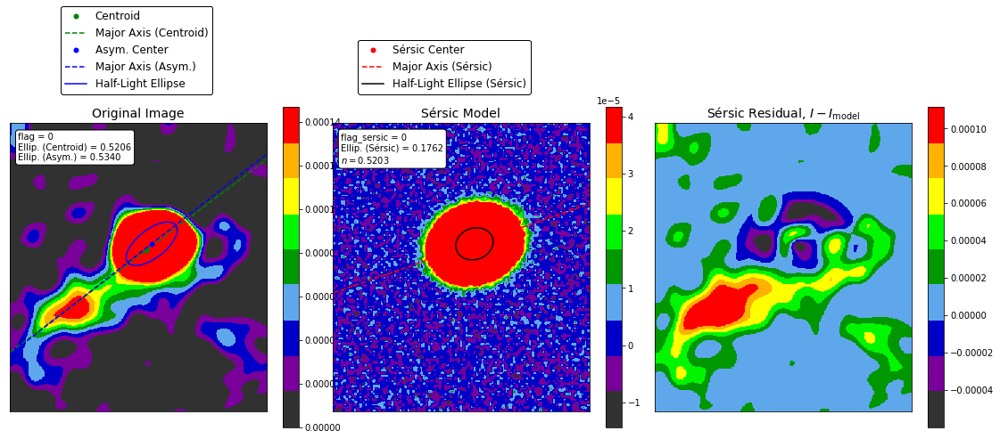

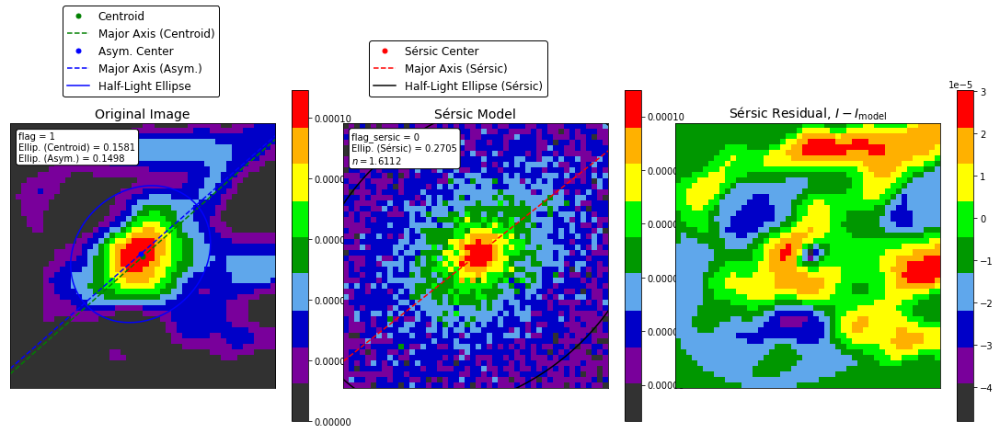

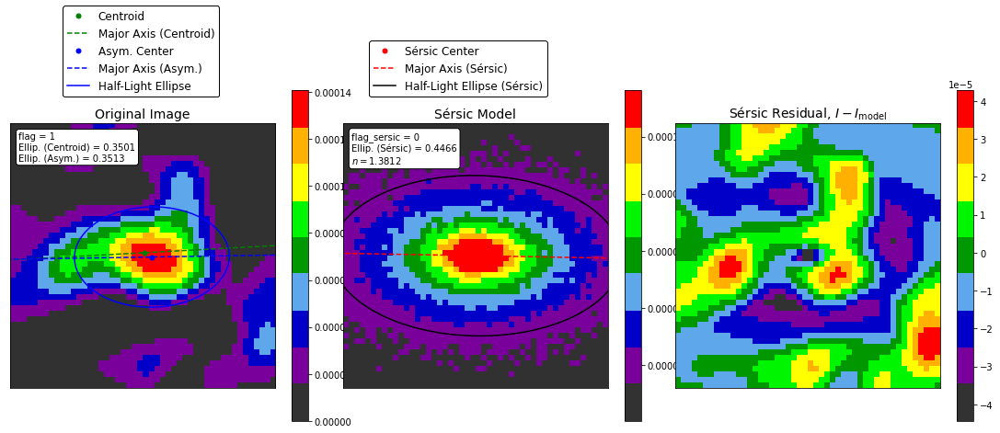

In [796]:
from astropy.convolution import Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma
import scipy.ndimage as ndi
from statmorph.utils.image_diagnostics import make_figure
import scipy
import statmorph
%matplotlib inline
for bcg in good_detections:
#     fig,ax = plt.subplots(1,5, figsize = (8,5))
#     ax = ax.ravel()
    file = glob.glob(img_path + "Natural/fits/" + bcg + "_*.fits")[0]
    threshold = 4 * 2e-5
    data, header, wcs = open_fits.read_alma_fits(file)
    cutout = open_fits.image_cutout(file, 5)
    ny, nx = cutout.data.shape
    y, x = np.mgrid[0:ny, 0:nx]
    bmaj = header['BMAJ']*u.deg
    bmin = header['BMIN']*u.deg
    bpa = u.Quantity(header['BPA'], unit = "deg")
    cdelt1 = header['CDELT1']*u.deg
    cdelt2 = header['CDELT2']*u.deg
    x_sigma = bmin/cdelt2
    y_sigma = bmaj/cdelt2
    psf = Gaussian2DKernel(x_stddev=gaussian_fwhm_to_sigma*x_sigma, y_stddev=gaussian_fwhm_to_sigma*y_sigma, theta = bpa, x_size = cutout.data.shape[0], y_size = cutout.data.shape[1]).array.value
    
    image = cutout.data
    image[image<0] = 0
    weightmap = np.full(image.shape, 2.5e-5)
    
    morph = sersic_profile(image, threshold, weightmap, None)
    
    model_psf_convolved = scipy.signal.fftconvolve(np.float64(morph._sersic_model(x,y)), np.float64(psf), mode='same')
    
#     ax[0].imshow(np.float64(morph._cutout_stamp_maskzeroed),origin = 'lower')
#     ax[1].imshow(psf, origin = 'lower')
#     ax[2].imshow(morph._sersic_model(x,y), origin = 'lower')
#     ax[3].imshow(model_psf_convolved, origin = 'lower')
#     ax[4].imshow(cutout.data - model_psf_convolved, origin = 'lower')
    fig = make_figure(morph)

In [770]:
cutout.data.shape

(111, 111)

In [7]:
import pickle
with open("/Users/arames52/Research/Analysis/mrs.pkl", "rb") as f:
    mrs_dict = pickle.load(f)

In [8]:
mrs_dict

{'CDFS-18': 5.33811177820245,
 'CDFS19': 5.33811177820245,
 'ES1-12': 5.33811177820245,
 'ES1-18': 5.33811177820245,
 'ES1-25': 5.33811177820245,
 'ES1-26': 5.33811177820245,
 'ES1-34': 5.33811177820245,
 'ES1-35': 5.33811177820245,
 'ES1_z_0.88': 3.6131978667318347,
 'ES1_z_0.99': 3.6131978667318347,
 'ES1_z_0.99b': 3.6131978667318347,
 'ES1_z_1.04': 3.6131978667318347,
 'ES1_z_1.38': 3.616378237487128,
 'ES1_z_1.40': 3.616378237487128,
 'ES1_z_1.60': 3.616378237487128,
 'ES1_z_1.65': 3.616378237487128,
 'ES1_z_1.70': 3.616378237487128,
 'XMM-113': 3.6131978667333273,
 'XMM-11': 5.290979719342685,
 'XMM-19': 5.290979719342685,
 'XMM-27': 5.290979719342685,
 'XMM-29': 5.290979719342685,
 'XMM-30': 5.290979719342685,
 'XMM_z_0.81': 3.6131978667333273,
 'XMM_z_0.9': 3.6131978667333273,
 'XMM_z_1.0': 3.6131978667333273}

In [31]:
mrs_dict['CDFS-18']/2 * 1.25e-05

3.336319861376531e-05